<h1><center><b> DA&V (LAB_4), Image preprocessing </b></center></h1>

***INSTRUCTIONS*** <br>
You all are required to perform the required tasks for image data. You can do all tasks using opencv library except the ones where you are bound not to use library.

The data to perform this lab can be downloaded online or you can use the given image, use them according to the task.

<br>
<h1><center>GOOD LUCK, Happy Labbing </center></h1>

### Task.1 Read Image and show the output

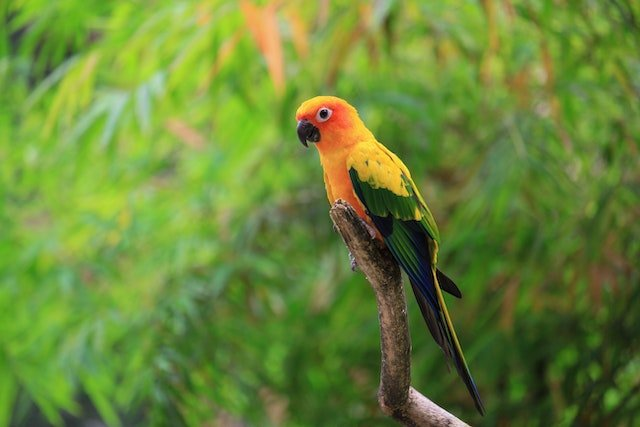

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Read Images
img = cv2.imread('bird.jpg')

# Output Images
cv2_imshow(img)

### Task.2 Change the image into greyscale
1. Do this by library
2. Do it without library

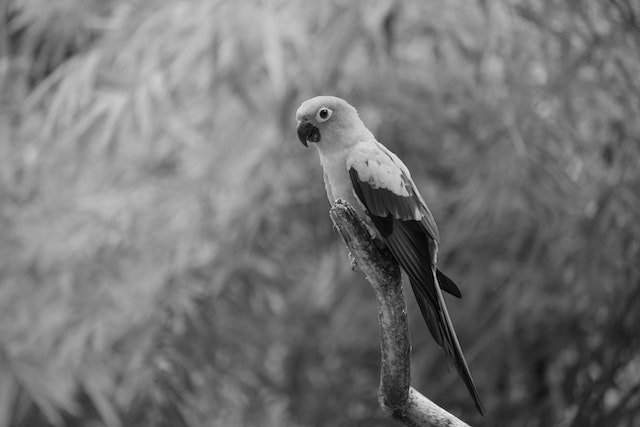

-1

In [ ]:
from google.colab.patches import cv2_imshow
gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

cv2_imshow(gray_image)
cv2.waitKey(0)

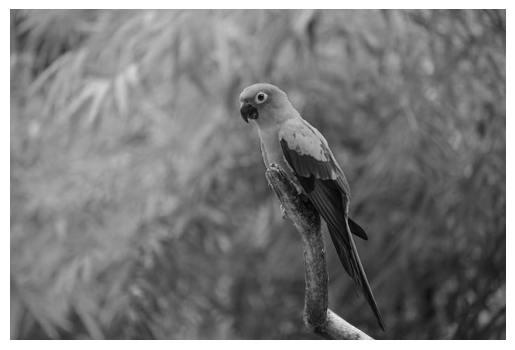

In [ ]:
import matplotlib.pyplot as plt
red = img[:, :, 0]
green = img[:, :, 1]
blue = img[:, :, 2]

# convert image to grayscale
gray_img = (0.299 * red + 0.587 * green + 0.114 * blue)

plt.imshow(gray_img, cmap=plt.get_cmap("gray"))
plt.axis('off')
plt.show()

### Task.3 Add noise to an image.

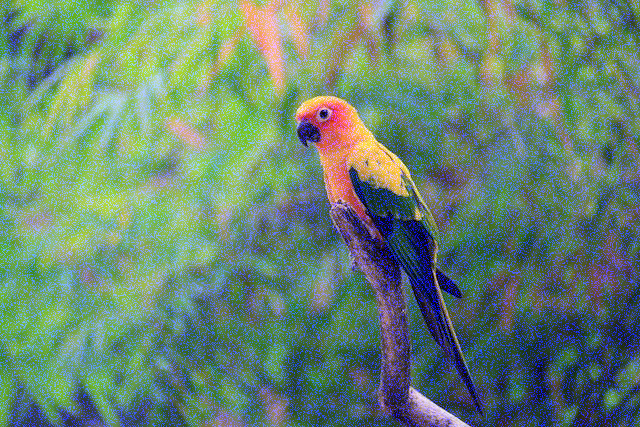

In [ ]:
import numpy as np
mean = 0
stddev = 180
noise = np.zeros(img.shape, np.uint8)
cv2.randn(noise, mean, stddev)

noisy_img = cv2.add(img, noise)

cv2.imwrite('noisy_img.jpg', noisy_img)
cv2_imshow(noisy_img)

### Task.4 Image Enhancement
1. Color correction (Correct color cast)
2. Noise Reduction (Remove noise)
3. Enhance using (brigthness and contrast)

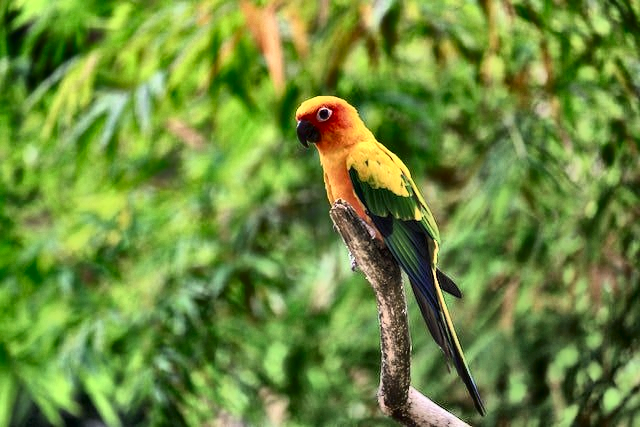

-1

In [ ]:
# Convert the image to LAB color space
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Split the LAB image into separate channels
l, a, b = cv2.split(lab)

# Apply CLAHE to the L channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
l = clahe.apply(l)

# Merge the LAB channels back together
lab = cv2.merge((l,a,b))

# Convert the LAB image back to RGB color space
output = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# Display the result
cv2_imshow(output)
cv2.waitKey(0)

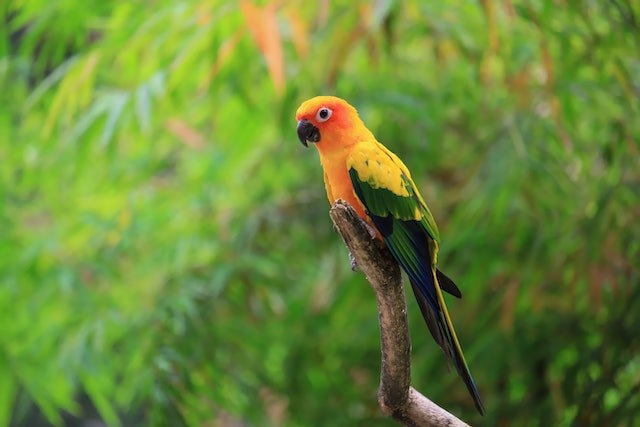

-1

In [ ]:
filtered = cv2.bilateralFilter(img, 5, 11, 11)

# Display the result
cv2_imshow(filtered)
cv2.waitKey(0)

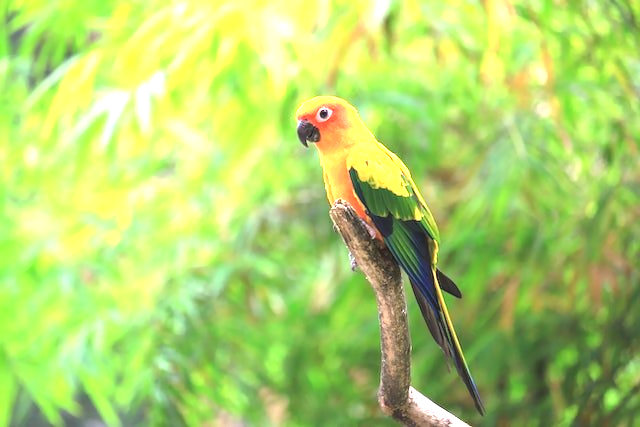

In [ ]:
import numpy as np

# Adjust brightness and contrast
alpha = 1.5 # Adjust these values as needed
beta = 25
enhanced_image = cv2.convertScaleAbs(filtered, alpha=alpha, beta=beta)

# Save the enhanced image
cv2.imwrite('enhanced_image.jpg', enhanced_image)
cv2_imshow(enhanced_image)

Image compression, compress the image and show original and compressed image as output.

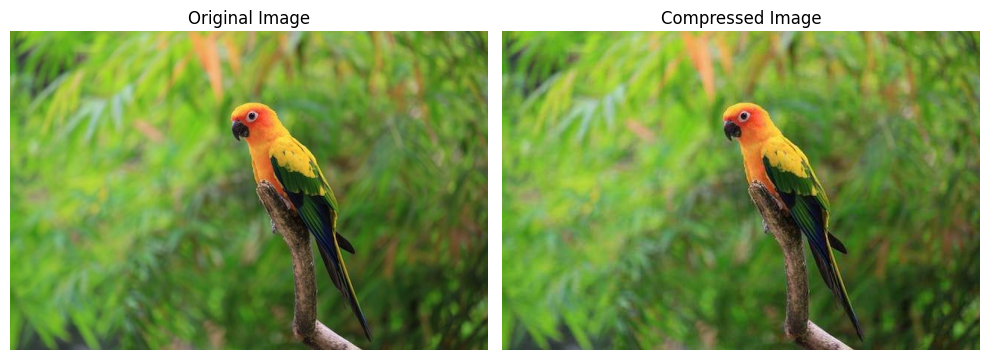

True

In [ ]:
import numpy as np

compression_quality = 50

encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), compression_quality]
_, compressed_image = cv2.imencode('.jpg', img, encode_param)

decompressed_image = cv2.imdecode(compressed_image, cv2.IMREAD_COLOR)
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(122)
plt.title(f'Compressed Image')
plt.imshow(cv2.cvtColor(decompressed_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

cv2.imwrite('compressed_image.jpg', decompressed_image)


Perform feature extraction by edge detection

Original Image


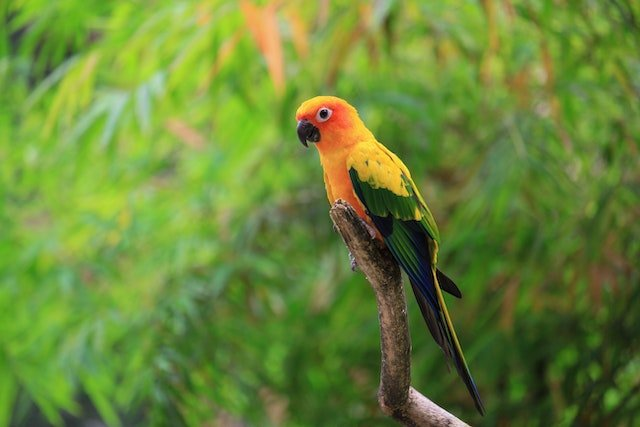

Edges


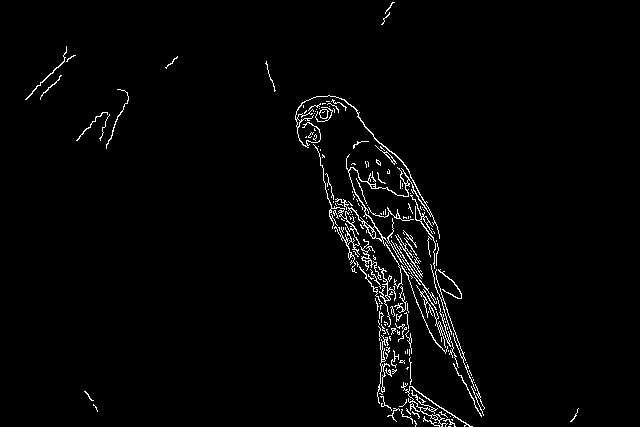

-1

In [ ]:
# Apply Canny edge detection
edges = cv2.Canny(img, 100, 200)  # Adjust the threshold values as per your requirement

# Display the original image and the edges
print('Original Image')
cv2_imshow(img)
print('Edges')
cv2_imshow(edges)
cv2.waitKey(0)

Perform image segmentation using opencv threshold

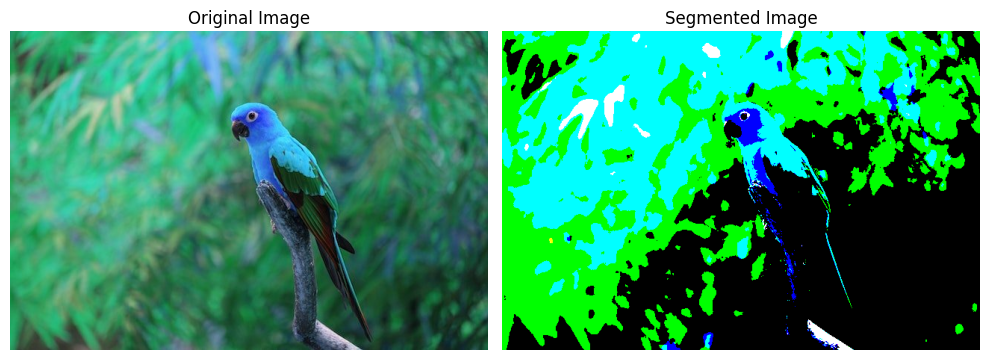

True

In [ ]:
# Apply thresholding (adjust the threshold value as needed)
threshold_value = 128  # You can adjust this threshold value
_, segmented_image = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)

# Display the original and segmented images side by side
plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(122)
plt.title('Segmented Image')
plt.imshow(segmented_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the segmented image to a file
cv2.imwrite('segmented_image.jpg', segmented_image)

Perform the Morphing techniques to smooth transition & interpolation between 2 images.

- PS: for this its better to use images of same dimension, otherwise resize to prevent from error.

In [ ]:
img2 = cv2.imread('butterfly.jpg')

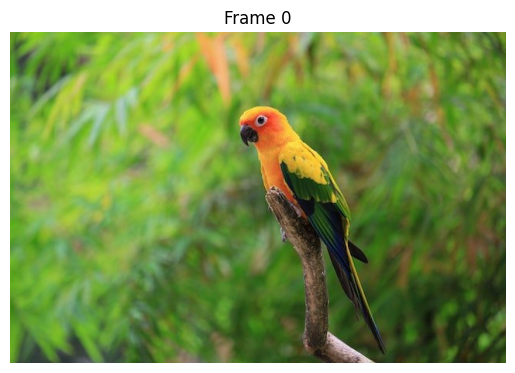

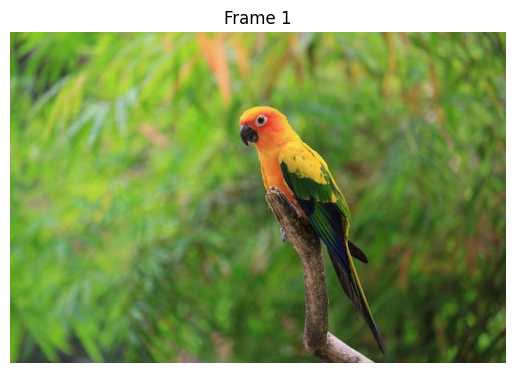

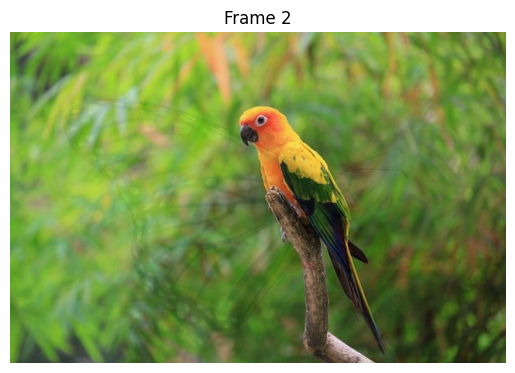

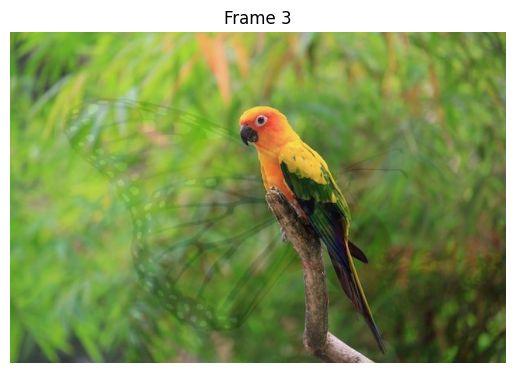

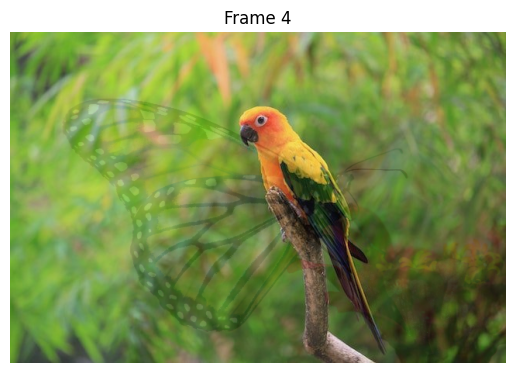

...

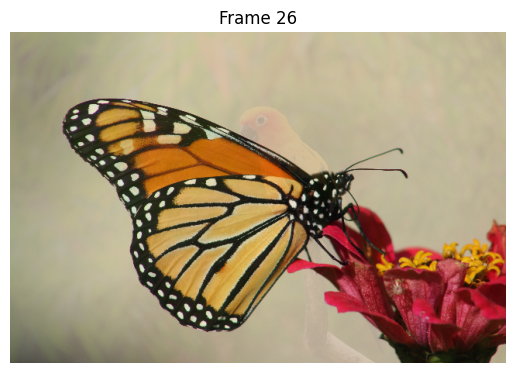

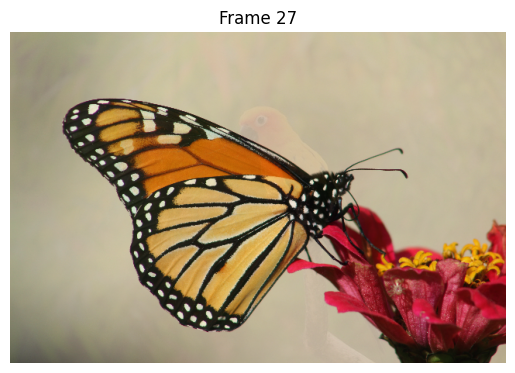

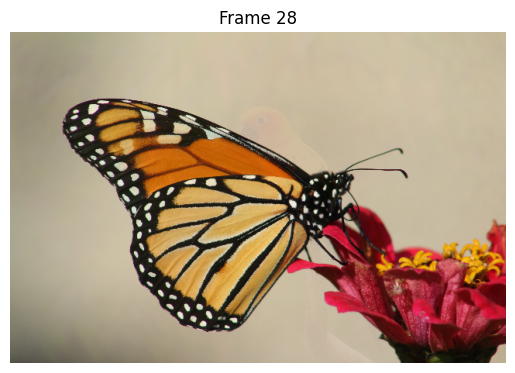

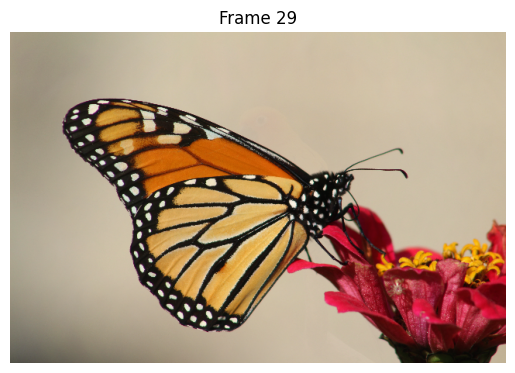

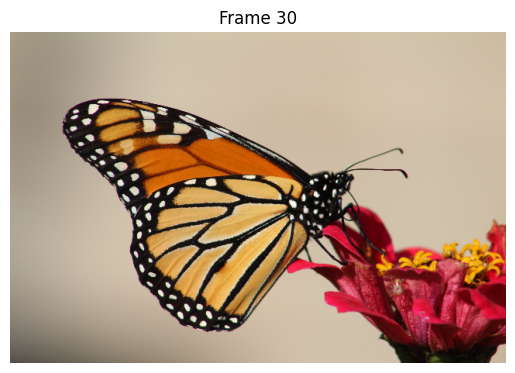

In [ ]:
num_frames = 30

# Resize images if they have different dimensions
if img.shape != img2.shape:
    img2 = cv2.resize(img2, (img.shape[1], img.shape[0]))
# Create intermediate frames and display them
morphed_images = []
for i in range(num_frames + 1):
    alpha = i / num_frames  # Interpolation parameter

    # Perform linear interpolation between the two images
    morphed_image = cv2.addWeighted(img, 1 - alpha, img2, alpha, 0)

    # Display the morphed image
    plt.imshow(cv2.cvtColor(morphed_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Frame {i}')
    plt.axis('off')
    plt.show(block=False)
    plt.pause(0.1)

    morphed_images.append(morphed_image)

# Wait for a key press to close the display window
cv2.waitKey(0)
cv2.destroyAllWindows()

# Save the morphed images
for i, morphed_image in enumerate(morphed_images):
    cv2.imwrite(f'morphed_frame_{i}.jpg', morphed_image)

Show the histogram of an image.
1. Greyscale Image
2. RGB Image

Output should contain Image and Histogram (e.g, RBG Image with RGB Histogram and same for Greyscale)

Text(0, 0.5, 'Frequency')

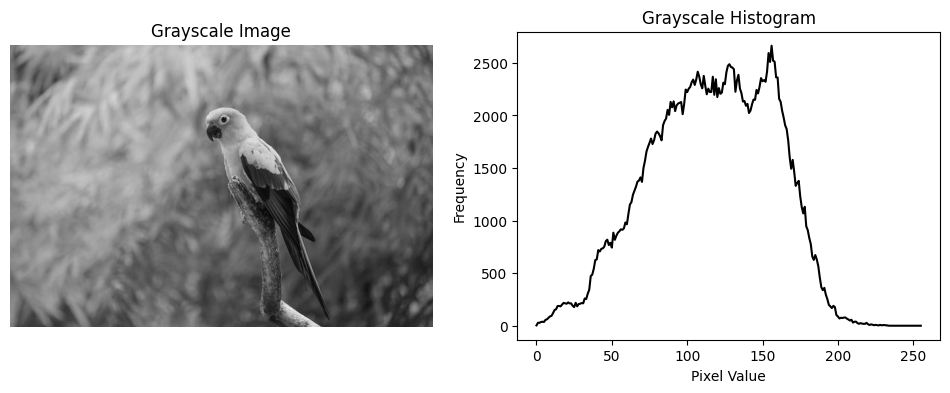

In [ ]:
# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
# Plot grayscale image
ax1.imshow(gray_image, cmap='gray')
ax1.set_title('Grayscale Image')
ax1.axis('off')

# Plot histogram for grayscale image
hist_gray = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
ax2.plot(hist_gray, color='black')
ax2.set_title('Grayscale Histogram')
ax2.set_xlabel('Pixel Value')
ax2.set_ylabel('Frequency')

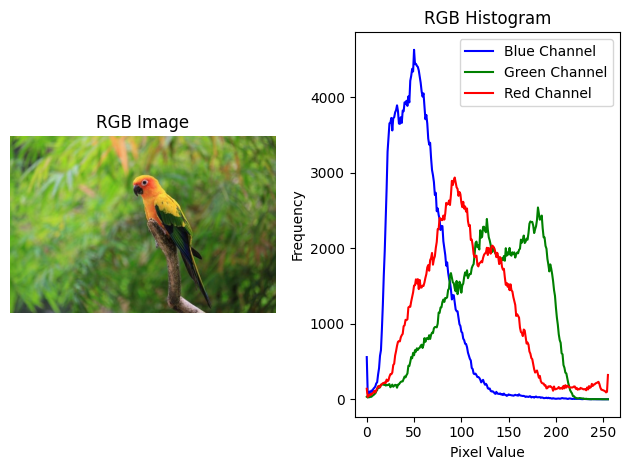

In [ ]:
# Split the RGB channels
b, g, r = cv2.split(img)

# Calculate the histograms for each channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Display the RGB image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('RGB Image')
plt.axis('off')

# Display the histograms for each channel
plt.subplot(1, 2, 2)
plt.plot(hist_b, color='blue', label='Blue Channel')
plt.plot(hist_g, color='green', label='Green Channel')
plt.plot(hist_r, color='red', label='Red Channel')
plt.title('RGB Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()

Normalize the Histogram mean perform Histogram Equalization (another technique for image enhancement)

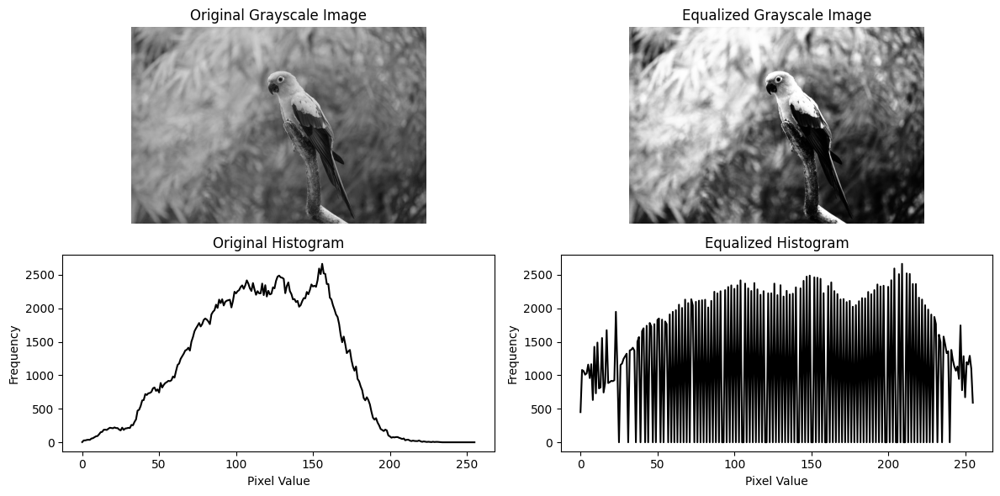

In [ ]:
# Perform histogram equalization
equalized_image = cv2.equalizeHist(gray_image)

# Calculate histograms for the original and equalized images
hist_original = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

# Display the original and equalized images
plt.figure(figsize=(12, 6))
plt.subplot(2, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Grayscale Image')
plt.axis('off')

# Display histograms
plt.subplot(2, 2, 3)
plt.plot(hist_original, color='black')
plt.title('Original Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(2, 2, 4)
plt.plot(hist_equalized, color='black')
plt.title('Equalized Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()